# Supplementary Notebook for "Three-Dimensional Fault Morphology Obtained from Unsupervised Machine Learning of Clusters of Aftershocks." 

Authors: Brennan Brunsvik, Gabriele Morra, Gabriele Cambiotti, Lauro Chiaraluce, Raffaele Di Stefano,
Pasquale De Gori, David A. Yuen.

This Jupyter Notebook combines the paper and code to improve transparency
in our work and allow the reader to run their own tests. The code can be ran interactively in the cloud thanks to Binder.

This notebook was designed to be simple to use while still giving control. The majority of code has been placed into seperate files. Almost all code used for the paper is contained within the combination of these notebooks. The figures are present, though they may look different than in the main text. 

First, set up the notebook by importing everything and designating folders for use. 

In [1]:
# THIS CELL CHOOSES HOW TO RUN THE NOTEBOOK. THE OTHER CELLS CAN BE LEFT ALONE.

runAllFigures = True
savePlotlyFigures = False

# The purpose of this code block is to decide whether to plot 3d interactive figures within the notebook
# or to save the plots as a file (temp-plot.html) that can be seen in the Supplementary_Jupyter_Notebook
# folder. The former option takes more memory and time, but automatically reloads. 
# The second option requires you to manually reload the file, but looks nicer. 
plotlyInNotebook = True
if plotlyInNotebook:
    from plotly.offline import iplot as plot
else:
    from plotly.offline import plot

In [2]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode
init_notebook_mode(connected=True)

In [3]:
if savePlotlyFigures:
    import chart_studio.plotly as py

In [4]:
# For loading saved values. 
variable_folder = "stored_variables/"
slip_dist_folder = 'slip_dist/'

In [5]:
#Import builtin
import os
import sys
import time
from datetime import datetime, date, time
import copy
import json

#sci and num py
import numpy as np
import scipy.optimize as optimize
from scipy.optimize import least_squares
from scipy.interpolate import Rbf
from scipy import interpolate
import scipy
import scipy.io as sio
from numpy.linalg import norm
from numpy.linalg import inv

import pandas as pd

#okada wrapper is crucial
try: 
    from okada_wrapper import dc3d0wrapper, dc3dwrapper 
except: 
    print('Please install the Okada Wrapper module.\
            https://github.com/tbenthompson/okada_wrapper') 

    
## visualization
# matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import matplotlib.patches as patches
from matplotlib.ticker import AutoMinorLocator
import matplotlib.mlab as mlab
import matplotlib
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial import ConvexHull
import matplotlib.path as mpltPath
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.mplot3d import proj3d


from scipy.spatial import Delaunay
import matplotlib.cm as cm
from functools import reduce

from IPython.display import Image
##

# For clustering
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import sklearn.mixture
import multiprocessing #!# may not need multiprocessing
import sklearn

# pyproj handles UTM projection
import pyproj

# import TDDispl
# import TDStrain

In [6]:
# Functions for loading data. 
%run ./Load_Data.ipynb

In [7]:
# Get functions that are used for many mathematical calculations. Open that file for details. 
%run ./Calculation_Functions.ipynb

In [8]:
# Functions for fault splitting 
%run ./Fault_Splitting.ipynb #!# remove this

In [9]:
# Get some fundamental functions for making figures. Open that file for details. 
%run ./Figure_Making_Functions.ipynb

In [10]:
# Get clustering info
%run ./clustering_base_file.ipynb

In [11]:
# Get some stress related stuff
%run ./stress_base_file.ipynb 
# ! This shouldn't be needed, 01/04/2019

# Abstract

Abstract
In seismic modelling, faults are normally assumed to be planar due to the lack of data which can constrain fault morphology. However, incorporating 3D morphology could be important for several methods, for example calculating mainshock induced stress changes. We utilize a data-analytical method to unveil the 3D rupture morphology of faults using unsupervised clustering techniques on earthquake hypocenters in seismic sequences. We apply this method to the 2009 L’Aquila sequence using a dataset of about 50,000 relocated events, mostly microearthquakes reaching magnitude of completeness equal to 0.7. The clustering distinguishes the earthquakes as occurring on three main faults. We then represent the main L’Aquila fault morphology using splines. This method shows promise as a step toward robustly and quickly obtaining 3D rupture morphologies where earthquake sequences have been monitored. The 3D model is presented interactively online (https://plotly.com/~BrennanBrunsvik/12/#/), and the processing is presented in an interactive Jupyter Notebook. 

# Introduction


##  

The 3D morphology of faults and earthquakes is generally unknown at depth due to the lack of information which can constrain it. We present an approach where we use machine learning to find the 3D morphology of faults based on the spatial distribution of aftershocks in seismic sequences. We apply this method to the 2009 L’Aquila seismic sequence in the central Apennines in Italy, which was thoroughly monitored and resulted in several hundred fatalities. Understanding 3D fault morphology can be useful in many ways. The hazard associated with these earthquakes is exacerbated by the lack of knowledge of potentially active fault locations and morphologies (Skoumal, 2019). Insight into future earthquake hazard and triggering (Verdecchia et al., 2018) could be improved with better knowledge of fault morphology models (Mildon et al., 2016). Inaccuracies in fault morphology can interfere with earthquake source inversions, resulting in unrealistic slip distributions (Ragon, Sladen, and Simons, 2018) and affecting coulomb stress calculations (Kaven and pollard, 2013). The role of fluids is important in earthquake triggering through the Apennines (Miller, 2004; Di Luccio et al., 2010; Lucente et al., 2010; Malagnini et al., 2012), and may be better accounted for if fault morphologies are known. The morphology of faults also influences dynamic stress simulations (e.g. Pelties et al., 2012; Galvez et al., 2014; Zhang, Zhang, and Chen, 2014), earthquake magnitude and location (Barka et al., 1988; Zielke, Galis, and Mai, 2017), tsunami generation (Moore et al., 2007), and other phenomena. This method gives insight into fault morphology and could be used to improve such modelling. 

At a large scale, for instance through the Wadati Benioff Zone, the 3D morphology of subducting slabs plates has been determined (Gudmundsson and Sambridge, 1998; Syracuse and Abers, 2006; Hayes, Wald, and Johnson, 2012). For megathrusts, for instance the 7.8 Mw 2015 Gorkha earthquake, fault morphology (Hubbard et al., 2016) has been recently incorporated into stress studies (Qiu et al., 2016; Landry and Barbot, 2018) providing important information on locked zones (Avouac, 2008; Avouac et al., 2015), which are crucial to understand as they can promote intense seismicity. For the major subduction zones of the Earth, it has been shown that curvature on a fault is an important control for earthquake rupture area and magnitude (Bletery et al., 2016), further suggesting that understanding fault morphology is important for assessing seismic hazard. 

There are a variety of methods used to find fault morphology. Active source seismic data can be used to build high resolution fault models (e.g. Lohr et al., 2008; Røe, Georgsen, and Abrahamsen, 2014). For instance, the 3D morphology of the low angle Altotiberina normal fault in northern Italy was obtained from merging seismic imaging, borehole analysis, geologic maps, and field surveys, and was used to model stresses associated with creep and to estimate a deterministic velocity model (Mirabella et al., 2011 and references therein; Anderlini et al., 2016; Latorre et al., 2017). Unfortunately, the costs of seismic imaging make this a difficult option. Fault geometry can also be illuminated from passive source methods. For example, modelling of seismic waves trapped in low-velocity damage zones can indicate fault geometry (Peng et al., 2003; Ben-Zion et al., 2003). The location of aftershocks has also been used to illuminate fault geometry. Analysts can distinguish earthquakes according to their source faults by viewing them in 3D, and surfaces can be fit to the aftershocks to model these faults (e.g. Carena Suppe, and kao, 2002). However, this relies on the subjective determination of faults in seismic clusters. 

Machine learning is proving very useful in Earth science (Kong et al., 2019; Bergen et al., 2019); for example, in determining earthquake magnitudes (Mousavi and Beroza, 2019), analyzing lab quakes (Rouet-Leduc et al., 2017), and picking phase arrivals (Zhu and Beroza, 2019). We employ unsupervised machine learning clustering to automate fault detection using hypocenter locations (Pedregosa et al., 2011). Clusters of similar data (e.g. location, time of occurrence, magnitude, etc.) can be found using these techniques. There have been several applications of clustering in Earth Science. For example, in earthquake relocation (Trugman and Shearer, 2017), investigation of earthquake processes and precursors (Dzwinel et al., 2003; Dzwinel et al., 2005; Yuen et al., 2009), and distinguishing fault planes in focal mechanisms (Rietbrock et al., 1996). Clustering of hypocenter locations has been done to establish seismic zones for probabilistic seismic hazard analysis, where the goal was not necessarily to extract fault morphology (Weatherill and Burton, 2009; Ansari, Firuzi, and Etemadsaeed, 2015; Novianti, Setyorini, and Rafflesia, 2017; Hall et al., 2018; Scitovski, 2018). Clustering has also been used to investigate fault geometry based on hypocenter information through a modification of the clustering algorithm k-means (Ouillon et al., 2008; Ouillon and Sornette, 2011; Wang et al., 2013). In these cases, clusters were distinguished by fitting them with a series of planes. The RANSAC algorithm has also been used to find faults in hypocenter data and to model them with 3D surfaces (Kaven and Pollard, 2013). Ultimately, clustering has the capability to automatically identify faults in hypocenter data to aid in inverting for fault morphology.  

We choose to apply our clustering-based method to the L’Aquila swarm in the central Apennines. The sequence was particularly well monitored, with over 50,000 relocated aftershocks throughout 2009 (Valoroso et al., 2013). This large amount of data is well suited for data-driven techniques. Further, the fault morphology is relatively simple, making this a good region to test fault morphology inversion algorithms. Chiaraluce (2012) provided a review of the seismic activity in the central-northern Apennines with a focus on the 2009 L’Aquila sequence (Figure 1). The L’Aquila sequence activated a south-west dipping normal fault system about 50 km long (Lavecchia et al., 2012). The aftershocks occurred on three primary SE striking and SW dipping fault systems: L’Aquila, Campotosto, and Cittareale (Figures 1 and 2). The mainshock and a large portion of aftershocks occurred on the L’Aquila fault.  
Earthquakes associated with the L’Aquila sequence started at the end of 2008. Events continued for about 4 months and included a MW 4.0 earthquake on March 30th before the mainshock ruptured on April 6th (Chiaraluce et al., 2011). Before the mainshock, events were focused along ~10 km of the fault segment in the deepest part of the L’Aquila fault (e.g. Chiaraluce, 2012; Valoroso et al., 2013). The aftershocks included several MW>5 events (Chiaraluce, 2012). Southeast of the mainshock, a MW 5.4 event occurred on the L’Aquila fault. Campotosto fault seismicity included a MW 5.0 event on April 6th, and MW 5.0 and 5.2 events on April 9th. These events occurred on the shallower, steeply dipping portion of the Campotosto fault. The deeper, steeply dipping section of the Campotosto fault appears kinked at its base where seismicity abruptly changes to low dip. A MW 4.4 event occurred later on June 22nd beneath the kink, on the gently dipping portion of the Campotosto fault. On the 25th of June, a 3.9 MW earthquake occurred on a normal fault near Cittareale toward the northernmost portion of the L’Aquila seismic sequence. Aftershocks decayed in magnitude and rate throughout 2009. 

#### Figure 1
Modified from Chiaraluce et al. (2017). Map view of local seismicity in the central Apennines. The inset map shows specifically the L’Aquila sequence that we study. Dark blue crosses show the 2009 L’Aquila seismic sequence. Light blue crosses show the 1997 Colfiorito seismic sequence. Black dots show the Amatrice-Visso-Norcia sequence which started in 2016. Black squares show historical earthquakes. Green stars are events with MW≥ 5.0. Red stars are events with MW ≥ 6.0. Focal mechanisms are for events with MW≥ 5.0. Yellow stars and associated focal mechanisms are for events on January 18, 2017 with 5.0≤ML≤5.5.

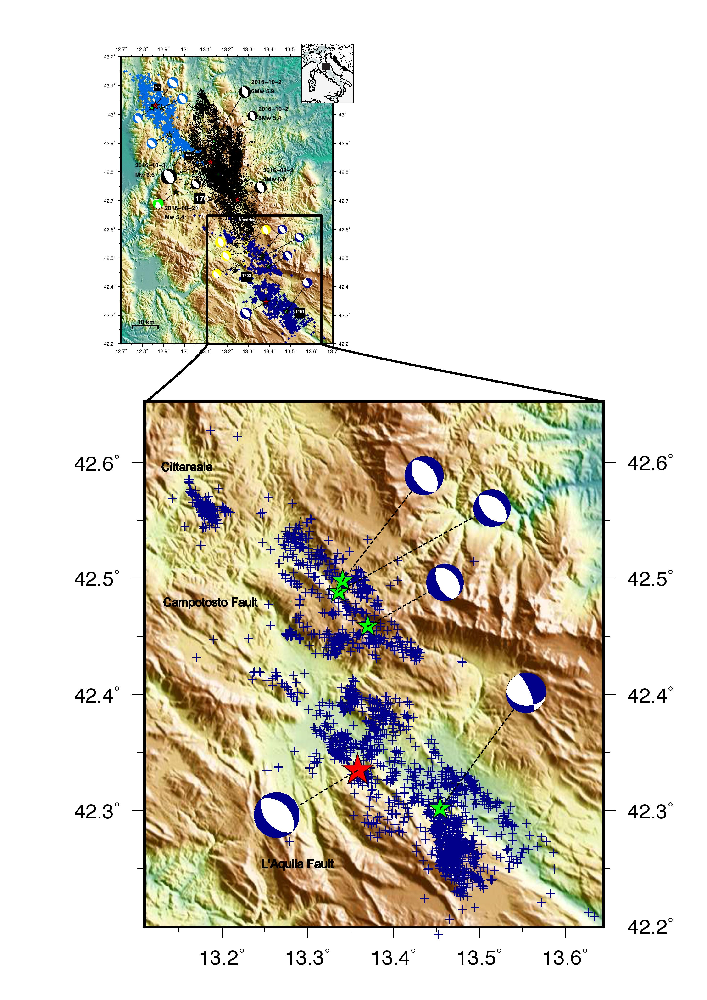

In [12]:
Image(filename='Figure_Map_corrected.jpg') 

#### Figure 2
Simplified schematic of the fault system involved in the L’Aquila sequence. Seismic activity occurred dominantly on the L’Aquila, Campotosto, and Cittareale faults. The L’Aquila fault hosted the mainshock. The faults strike approximately SE.

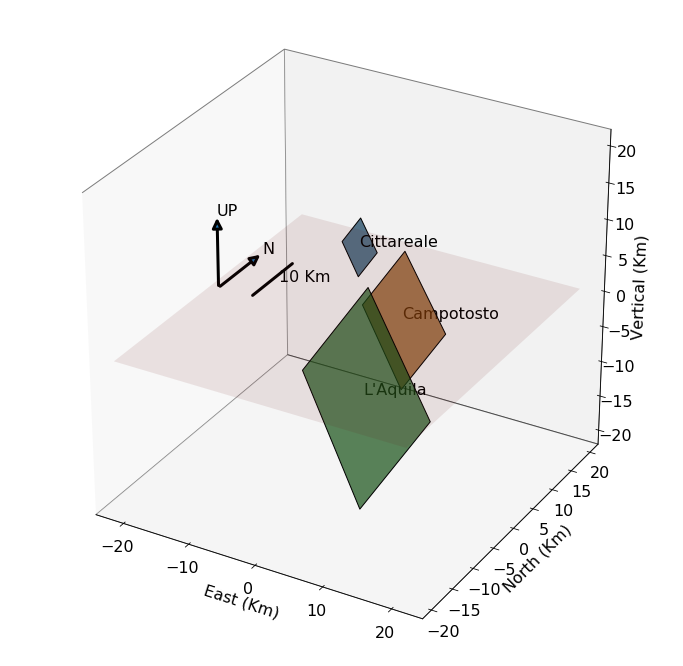

In [13]:
matplotlib.rcParams.update({'font.size': 16})


# approximate fault locations, sizes, dips
p1 = np.array([11.15, -15.17, -7.2])
p2 = np.array([-10.58, 10.88, -8.98])
p = p1-p2
laqstrikewidth = np.linalg.norm(p)
laqdipwidth = .4 * laqstrikewidth

camstrikewidth = 2/3 * laqstrikewidth
camdipwidth = .4 * camstrikewidth 

citstrikewidth = np.array([10])
citdipwidth = .4 * citstrikewidth

cit = [-14.8,  25.5, -5.09, citstrikewidth, citdipwidth, - 5 * np.pi/4, 50 * np.pi/180]
cam = [-2.83,  17.3, -8.55, camstrikewidth, camdipwidth, - 5 * np.pi/4, 50 * np.pi/180]
laq = [ 4.31, -3.64, -6.78, laqstrikewidth, laqdipwidth, - 5 * np.pi/4, 50 * np.pi/180]
allFaults = [cit, cam, laq]

def makeSchemSurfPoints(x, y, z, xWidth, yWidth, s, d, reps = 2):
    # return points on at outside of fault based on inner point of fault
    __, strikeUnit = faultUnitVectors(s, d, 0       )
    __, dipUnit    = faultUnitVectors(s, d, -np.pi/2)
    
    points = np.zeros((reps, reps, 3))
    points[:, :] = np.array([x, y, z])
    
#     mults = np.array([-.5, .5])
    mults = np.linspace(-.5, .5, reps)
    for i, m1 in enumerate(mults):
        for j, m2 in enumerate(mults):
            points[i, j] += m1 * strikeUnit * xWidth + m2 * dipUnit * yWidth
            
    xs = points[:, :, 0].ravel()
    ys = points[:, :, 1].ravel()
    zs = points[:, :, 2].ravel()
    
    return xs, ys, zs




fig=plt.figure(figsize=(12, 12))
ax=fig.add_subplot(111,projection='3d')

for fault in allFaults:
    reps = 2
    x, y, z = makeSchemSurfPoints(*fault, reps = reps)
    x=x.reshape((reps, reps))
    y=y.reshape((reps, reps))
    z=z.reshape((reps, reps))
    ax.plot_surface(x, y, z, linewidth=1, edgecolors='k', alpha = .7)
   
arrow = [np.array([-20, -20]),
         np.array([0, 10]),
         np.array([0, 0]) ]
class Arrow3D(FancyArrowPatch):
    # arrows in 3D
    def __init__(self, xs, ys, zs, *args, **kwargs):
        FancyArrowPatch.__init__(self, (0,0), (0,0), *args, **kwargs)
        self._verts3d = xs, ys, zs

    def draw(self, renderer):
        xs3d, ys3d, zs3d = self._verts3d
        xs, ys, zs = proj3d.proj_transform(xs3d, ys3d, zs3d, renderer.M)
        self.set_positions((xs[0],ys[0]),(xs[1],ys[1]))
        FancyArrowPatch.draw(self, renderer)
a = Arrow3D(*arrow, mutation_scale=20, 
                lw=3, arrowstyle="-|>")
ax.add_artist(a)
ax.text3D(arrow[0][1], arrow[1][1], arrow[2][1], 'N')

arrowUp = [arrow[0],
         np.array([0, 0]),
         np.array([0, 10])]
a = Arrow3D(*arrowUp, mutation_scale=20, 
                lw=3, arrowstyle="-|>")
ax.add_artist(a)
ax.text3D(arrowUp[0][1], arrowUp[1][1], arrowUp[2][1], 'UP')


scaleBar = [np.array([-15,  -15]),
            np.array([0 ,  10]),
            np.array([0, 0]) ]
b = Arrow3D(*scaleBar, mutation_scale=20, lw=3, arrowstyle = '-')
ax.add_artist(b)
ax.text3D(scaleBar[0][1]+1, scaleBar[1][1] - 5, scaleBar[2][1], '10 Km')

labels = ['Cittareale', 'Campotosto', 'L\'Aquila']
for i, fault in enumerate(allFaults):
    ax.text3D(fault[0], fault[1], fault[2], labels[i])
    
l = ax.get_xlim()
ax.set_ylim(l)
ax.set_zlim(l)

groundrange = np.array(l, l)
xg, yg = np.meshgrid(groundrange,groundrange)
zg = np.zeros(xg.shape)
ax.plot_surface(xg, yg, zg, alpha = .1)

ax.set_xlabel('East (Km)')
ax.set_ylabel('North (Km)')
ax.set_zlabel('Vertical (Km)')


ax.xaxis.pane.set_edgecolor('black')
ax.yaxis.pane.set_edgecolor('black')
ax.zaxis.pane.set_edgecolor('black')
ax.grid(False)

# ax.view_init(elev = 20, azim = -10)

plt.show()

# Methods
The essence of this method is to use aftershock locations to invert for the L’Aquila fault morphology in an automated way. The aftershocks must first be separated according to the faults that they occurred on. We use clustering to do this, similar to Ouillon et al. (2008). Then, we invert for the 3D morphology of the earthquake cluster which corresponds to the L’Aquila fault by fitting the hypocenter locations using splines. 

In order to interpolate a fault surface based on hypocenters, we first associated aftershocks with their respective faults. To distinguish between different faults in the hypocenter data, we perform clustering on the hypocenters based on their spatial locations. Many overviews of clustering algorithms are available (e.g. Omran, Engelbrecht, and Salman, 2007; Joshi and Kaur, 2013). The machine learning clustering approach attempts to find relationships in data based on their similarity. In our case, where the locations of different earthquakes are close, clustering will recognize that these earthquakes occurred on the same fault. If the earthquakes are distant from each other, clustering recognizes them as occurring on different faults. We use Spectral clustering and DBSCAN (Pedregosa et al., 2011) in order to allow clusters to be elongated and non-planar. 

Several challenges come up using this approach. Where faults intersect, hypocenters of different faults can be very close to each other and clustering algorithms can be blind to this. Also, aftershock location inaccuracy is inevitably a problem due to imperfect knowledge of crustal 3D velocities and elastic properties. Thus, hypocenters tend to erroneously appear between multiple faults, and to which fault these hypocenters belong to is unclear. To mitigate this, clustering is done in two iterations; first with a spectral method, and second with the DBSCAN method. 

During the first clustering iteration, we used the spectral clustering algorithm from Scikit-Learn (Pedregosa et al., 2011). Spectral clustering is good at distinguishing clusters when data are connected but a point’s distance from the center of the cluster is irrelevant, and when the clusters are non-convex. This algorithm computes the Gaussian affinities (the quantitative similarity between points) based on the distances between points. It then creates a normalized Laplacian matrix and clusters based on the eigenvectors (Von Luxburg, 2007). We used only the 343 earthquakes with ML >= 2.5 during the first clustering interation. This helps to remove small aftershocks that blur the distinction between different faults. It also makes the memory demanding spectral clustering algorithm more stable and manageable. This step separated the hypocenters into three dominant clusters. 

The second clustering iteration requires a modified data set to enhance fault like trends. For the cluster containing the mainshock, we found a least squares distance best fit plane to the hypocenters. The positions of all hypocenters were then stretched by a factor of 5 in the direction normal to the best fit plane. The stretching factor is subjectively chosen for ideal performance on the L’Aquila fault. The purpose is that trends along the fault surface are left alone, but deviations from this surface are amplified. With planar like trends more pronounced, clustering algorithms are much more successful at clustering along faults and keeping them separate from neighboring faults. This also reduces the problem that some hypocenter groups may lie along the same fault, but there are so few hypocenters between these groups that clustering algorithms normally find them as separate clusters. This spatial modification allows for the use of less computationally expensive clustering methods. 

For the second clustering iteration on the modified hypocenters, we used DBSCAN (Density-Based Spatial Clustering of Applications with Noise; Ester et al., 1996; Pedregosa et al., 2011). This works by first finding a sample that has a minimum number of other samples, MinPts, within a minimum distance, Eps, and establishes this as a core sample of a cluster. Nearby core points become part of the same clusters. Points that do not satisfy the MinPts condition but are near another core point are considered part of the same cluster as the core point, but they are not themselves core points. Points that both have distance > Eps from all core points, and cannot become the core point for a new cluster are considered noise and are excluded from all clusters. We chose Eps=2.0 km and MinPts=80 samples. The selection of these values is somewhat arbitrary and choosing values that work well in one location may not work well in other locations. MinDist and Eps were chosen to perform best for the L’Aquila cluster with some expense to performance of the other clusters.

The hypocenters in the clustered fault which contained the mainshock were spatially interpolated to make a best fit 3D fault surface. The following coordinate system is used: x1’ faces along dip to the southeast, x2’ faces up dip, and x3’ faces the hanging wall, normal to the plane. We use bi-cubic splines (Jones et al., 2014) to interpolate the hypocenters. We choose splines because high-order polynomials tend to suffer from Runge’s phenomenon where unnatural oscillations occur between interpolated data. Using splines, this effect is mitigated. The spline algorithm constructs a piece-wise polynomial which is continuous and smooth. On the plane that best fits the aftershock locations of the L’Aquila fault cluster, we created a 7x7 grid of knots (nodes on which spline parameters are solved) extending from the minimum to the maximum hypocenter locations in x1’ and x2’ such that all of the cluster is contained within the knot grid. Knot parameters are inverted using least squares to minimize the distance between the hypocenters and the splines. The knot parameters describe 3rd order polynomials which are defined only locally surrounding the knot. The resulting spline indicates the best fit fault model within the cluster of L’Aquila fault earthquakes. 

In [14]:
print('Delete this cell, 06 29 2020')
# object with info for all hypocenters. 
allHypo = hypoData(minMag=None)

allHypo.labels=np.zeros(allHypo.mL.size)

if False:
    allHypo.plot3dclusters(pointSize=1, save=False)

# Spectral clustering
sp = spClust()
sp.minMag=2.3
sp.getHypocenters()

sp.assign_labels="discretize"
sp.n_init=10
sp.beta=1
sp.n_clusters=3 # choose this before hand based on the 3 main faults

sp.cluster()
# spectral clustering is completed 
# sp.labels indicates cluster identities
if True:
    sp.plot3dclusters(pointSize=7)#, name = 'spectral', save = savePlotlyFigures)

Delete this cell, 06 29 2020


/Users/brennanbrunsvik/anaconda3/envs/fault_morph/lib/python3.7/site-packages/sklearn/cluster/_spectral.py:482: UserWarning:

The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.



In [15]:
# Make a best fit plane to the cluster containing the mainshock

laqFault = sp.labels==1 # make bool for hypocenters in the L'Aquila fault cluster

x = sp.x[laqFault]
y = sp.y[laqFault]
z = sp.z[laqFault]
mL = sp.mL[laqFault]
strikeHyp = sp.st1[laqFault]
dipHyp = sp.dp1[laqFault]
strike2Hyp = sp.st2[laqFault]
dip2Hyp = sp.dp2[laqFault]

focalBool = (~( (sp.st1==0) * (sp.st2==0) * (sp.dp1==0)
               * (sp.dp2==0) * (sp.rk1==0) * (sp.rk2==0) ))[laqFault]

# maxMag = 4
# magBool = (mL<=4)


splineNodesLine = 7

# exclude points over 10km from plane. Do rms fit. 
laqPlane = interp(x, y, z, 
               strikeHyp=strikeHyp, dipHyp=dipHyp, strike2Hyp=strike2Hyp, dip2Hyp=dip2Hyp,focalBool=focalBool,
               eps=.1, magnitudeWeight=mL, minPlaneDist = 10000,exp=2,
               splineNodesStrike = splineNodesLine, splineNodesDip = splineNodesLine)

# Prepare for second clustering attempt by "stretching" hypocenters.
db2 = dbClust() #!# rename db2 to db
db2.minMag=None # use all earthquakes
db2.getHypocenters()
db2.geogToMet()

# p is vector of points.
db2.p = rotateUniVec(db2.p-np.array([laqPlane.xC,laqPlane.yC, laqPlane.zC]),
    laqPlane.strikeHat, laqPlane.dipHat, laqPlane.normalHat)

# stretch points away from plane, but not along plane. 
db2.p[:,2]*=5

# distances from plane in new coordinate system
distEach = np.abs(distFromPlane(db2.x, db2.y, db2.z, 
                                laqPlane.xC, laqPlane.yC, laqPlane.zC, 
                                laqPlane.normalHat[0], laqPlane.normalHat[1], laqPlane.normalHat[2]))

# We get a warning regarding matrix deficiency, but this is not relevant to the aquired results.

/Users/brennanbrunsvik/anaconda3/envs/fault_morph/lib/python3.7/site-packages/scipy/interpolate/fitpack2.py:1126: UserWarning:


The coefficients of the spline returned have been computed as the
minimal norm least-squares solution of a (numerically) rank deficient
system (deficiency=81). If deficiency is large, the results may be
inaccurate. Deficiency may strongly depend on the value of eps.



In [16]:
db2.eps=2.0* 1e3
db2.min_samples=80
db2.fitdbscan() # cluster in modified axis system

#### Figure 3
Also available interactively online at https://plot.ly/~BrennanBrunsvik/16/. Final results from clustering hypocenters from the L’Aquila seismic sequence. Spectral clustering was first used to find three primary clusters. DBSCAN was then used on all hypocenter location data. The darkest blue dots correspond to noise. Other dark blue dots correspond to the Paganica fault, light blue to the Campotosto fault, and red to the Cittareale fault. Other clusters were found which do not necessarily relate to known faults.

In [17]:
if False or runAllFigures:
    db2.plot3dclusters(pointSize=1.6, save = savePlotlyFigures, lineWidthR=1e-10, name = 'Figure 3')
    
# if True:
#     db2.plot3dclusters(pointSize=.8, save = True, lineWidthR=1e-10, name = 'Figure S3')

In [18]:
# Create boolean showing which quakes are in L'Aquila cluster

# Then create boolean of those for which focal mechanisms are available
booLaqdb = db2.labels==0

allPoints = hypoData(minMag=None)
allPoints.getHypocenters()

x2 = allPoints.x[booLaqdb]
y2 = allPoints.y[booLaqdb]
z2 = allPoints.z[booLaqdb]
st1 = allPoints.st1[booLaqdb]
st2 = allPoints.st2[booLaqdb]
dp1 = allPoints.dp1[booLaqdb]
dp2 = allPoints.dp2[booLaqdb]
focalbooLaqdb = (~( (allPoints.st1==0 ) * (allPoints.st2==0 ) * (allPoints.dp1==0 )
  * (allPoints.dp2==0 ) * (allPoints.rk1==0 ) * (allPoints.rk2==0 ) ))[booLaqdb]

In [19]:
# %%capture 
# get rid of a unimportant warning

splineNodesLine = 7 # changing from 7, 02/15/2020
cutPoints = True # convex hull. 02/15/2020

# note that surface is object for spline interpolation
surface = interp(x2, y2, z2,
               strikeHyp=st1, dipHyp=dp1, strike2Hyp=st2, dip2Hyp=dp2, focalBool=focalBool,
               eps=.01, minPlaneDist = 10000,exp=2,
               splineNodesStrike = splineNodesLine, splineNodesDip = splineNodesLine, 
               cutPoints = cutPoints, smooth = 1e4)
# eps = .01, smooth = ??




surface.focalAvailable=focalbooLaqdb

# if True:
#     print('this is a test! remove it!')
#     surface.pS *= -1
#     surface.pD *= -1 
#     print("It doesn't work!")

# plotSurface(surface)

/Users/brennanbrunsvik/anaconda3/envs/fault_morph/lib/python3.7/site-packages/scipy/interpolate/fitpack2.py:1126: UserWarning:


The coefficients of the spline returned have been computed as the
minimal norm least-squares solution of a (numerically) rank deficient
system (deficiency=81). If deficiency is large, the results may be
inaccurate. Deficiency may strongly depend on the value of eps.



In [20]:
# Here, I save info from surface object to upload into a mainshock model.
# It has to be ran now, but is not relevant until the slip distribution inversion.

surface.gridNodesStrike = 40
surface.gridNodesDip = 24

#the outermost cell center be inset from the outermost part of surface:
shiftS = (np.amax(surface.pS) - np.amin(surface.pS)) / surface.gridNodesStrike * .5
shiftD = (np.amax(surface.pD) - np.amin(surface.pD)) / surface.gridNodesDip * .5
# Generate points on surface
surface.splineInterp(cutPoints=False, sEdgeShift = shiftS, dEdgeShift = shiftD)

# lat lon and depth of okada cells
latSurf, lonSurf = allPoints.metToGeog(surface.interpX, surface.interpY)
depthSurf = surface.interpZ

# Surface geometry (strike dip, etc.)
surface.surfaceNormal(surface.interpS, surface.interpD)
stSurf, dpSurf = normalToStrikeDip(surface.normalAprox)
surface.simpleCellWidths()
strikeWidth = surface.strikeWidth
dipWidth = surface.dipWidth

# 2d position for spline interpolation
interpS = surface.interpS
interpD = surface.interpD

# I save this as an array and load it later into a different class.
saveArrays([latSurf, lonSurf, depthSurf, stSurf, dpSurf, interpS, interpD, strikeWidth, dipWidth],
          fName = 'surfaceArraysCoarse', path = variable_folder)
##########

In [21]:
###########
# TRIANGULAR DISLOCATION VERSION
# this is the same as above, but for the triangular dislocation.
# the difference is that these points cover the entire surface,
# while the rectangle points do not touch the edge of the surface
# the variables that I save are different as well

surface.gridNodesStrike = 40
surface.gridNodesDip = 24

#the outermost cell center be inset from the outermost part of surface:
shiftS = 0
shiftD = 0 
# Generate points on surface
surface.splineInterp(cutPoints=False, sEdgeShift = shiftS, dEdgeShift = shiftD)

# lat lon and depth of okada cells
latSurf, lonSurf = allPoints.metToGeog(surface.interpX, surface.interpY)
depthSurf = surface.interpZ

# Surface geometry (strike dip, etc.)
surface.surfaceNormal(surface.interpS, surface.interpD)
stSurf, dpSurf = normalToStrikeDip(surface.normalAprox)
surface.simpleCellWidths()
strikeWidth = surface.strikeWidth
dipWidth = surface.dipWidth

# 2d position for spline interpolation
interpSTD = surface.interpS
interpDTD = surface.interpD

# I save this as an array and load it later into a different class.
saveArrays([latSurf, lonSurf, depthSurf, stSurf, dpSurf, interpSTD, interpDTD, strikeWidth, dipWidth],
          fName = 'surfaceArraysCoarseTD', path = variable_folder)
########

In [22]:
surface.dip * 180 / np.pi


42.6395113218976

# Results
The final clusters, the results of DBSCAN, can be seen in Figure 3 (and interactively online https://plot.ly/~BrennanBrunsvik/16/). Nine clusters were recognized; The L’Aquila, Campotosto, and Cittareale fault systems are clearly represented. Of the 51339 events, 29357 were clustered as part of the main L’Aquila fault, 9553 on the Campotosto fault, and 5392 on the Citareale fault. We also find a cluster between the L’Aquila and Campotosto faults which appears to correspond to the Mt. San Franco fault (Lavecchia et al., 2012). The separation between major faults and more scattered and independent aftershocks (referred to as noise and rejected by the DBSCAN algorithm) appears successful. However, sets of faults antithetic to and intersecting the mainshock cluster contained a high density of aftershocks and these were not distinguishable from the L’Aquila fault through clustering. In particular, we observe ~3 faults antithetic to the main L’Aquila fault which were too closely connected to the main fault to distinguish (Figure 5). Similar to Ouillon et al. (2008), some faults will be clustered together; allowing the number of clusters to increase segregates hypocenters which belong to the same fault, while having less clusters tends to lump hypocenters of different faults together. Our shape of our clusters is neither ellipsoidal (Weatherhill and Burton, 2009), nor fixed within planes (Ouillon et al., 2008). They can be elongated or curved as much as the hypocenters require.

The 3D fault surface that best fits the clustered hypocenters can be seen in Figures 4 and 5 (and interactively online https://plot.ly/~BrennanBrunsvik/12/). The surface extends 34.0 km in x1’ (along strike) and 15.4 km in x2’ (along dip). Visually speaking, the surface is smooth and does not deviate greatly from a plane. It shows curvature similar to other 3D fault models generated with similar methods (Carena and Suppe, 2002; Kaven and Pollard, 2013). The basic plane from which the surface is built, where x3’=0, has a strike and dip of 143° and 42.7°, respectively. This is in close agreement with (Lavecchia et al., 2012), whose 3D reconstruction suggested a strike of ~140° and dip of ~45°. At the south-east of the fault surface, the dip suddenly decreases going from bottom to top at a depth of about 3 km. The fault surface wavers here as it interacts with the more complex distribution of hypocenters. At the north-west of the fault surface, it is very flat where hypocenter availability was low. 

We note specifically two locations on the surface where issues in the interpolation might have arose; (i) near the south-east edge of the fault where there are conjugate faults intersecting the L’Aquila fault (Figure 5), and (ii) at the north-west edge of the fault where there were few aftershocks for interpolation (Figure 4).

Regarding problem (i), because the clustering did not distinguish between some conjugate planes that were closely connected to the mainshock plane, the surface interpolation is slightly shifted by these conjugate fault hypocenters (Figure 5). Because the hypocenters were widely distributed near the fault in the direction normal to the fault (the aftershocks deviate from the 3D surface by an average magnitude of ~600 m), small variation in the fault surface does not conflict with the hypocenter distribution. It is thus likely not a problem that the surface is shifted slightly in this location. 

Regarding problem (ii), although the splines were inverted with regularly distributed knots, the hypocenters which were used to find the knot parameters were distributed unevenly. Particularly at the upper north-west of the fault, interpolation was done where few hypocenters were available. The spline parameters in this location are thus under-constrained. To address this problem, we applied a convex hull to the L’Aquila fault’s aftershocks and removed all portions of the inverted fault surface which extends outside of this polygon. 

To evaluate the accuracy of our 3D fault model, we compared its orientation to the orientation of earthquake focal mechanisms (Figure 6). This comparison is quantified as the angle between the normal vectors at the fault surface model and the normal vectors of the aftershock focal mechanisms. For the focal mechanisms, both the fault planes and auxiliary planes are used. We compare this orientation result for our 3D fault model with a planar model of Cirella et al. (2012). For both our 3D fault and for the planar model, there is alignment at two primary peaks of 20° and 90° which correspond to the fault and auxiliary planes of the focal mechanisms, respectively (Figure 6b). Agreement improves when the energy associated to each event (~10M) is used as a weight. Note that we do not include the focal mechanism of the mainshock in this analysis because it has too much weight.

#### Figure 4
(a) 2D representation of the aftershocks that were part of the Paganica fault cluster, and (b) the surface that interpolates them. Position is shown on the best-fitting plane to the hypocenters. Color represents distance in meters from the best fitting plane. The viewing angle is such that the viewer looks northeast and down. 

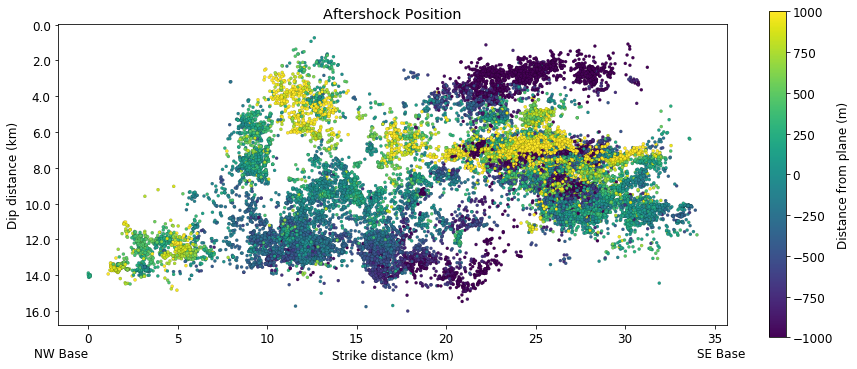

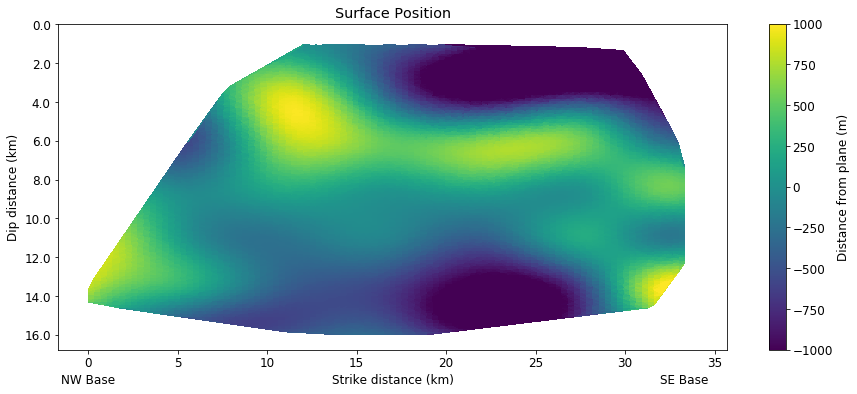

In [148]:
###! The aftershock image has been transposed! 020102020
def plotSurface(surface):
    surface.gridNodesStrike = 100
    surface.gridNodesDip = 100
    surface.splineInterp(cutPoints=True)
    cbarmin = -1e3
    cbarmax = 1e3

    matplotlib.rcParams.update({'font.size': 12})
    plt.figure(figsize=(15,6))

    xplot = (surface.pS-np.amin(surface.pS))/1000
    yplot = (surface.pD-np.amin(surface.pD))/1000
    #pS and pD are point (hypocenter) position in coordinate system of (strike, dip, normal)
    plt.scatter(xplot, yplot, 
                c = surface.pN, vmin = cbarmin, vmax = cbarmax, 
                s = 10, linewidths = .1, edgecolor = 'k') 
    plt.title('Aftershock Position')
    plt.xlabel('Strike distance (km)')
    plt.ylabel('Dip distance (km)')
    cbar = plt.colorbar()
    cbar.set_label('Distance from plane (m)')
    plt.axes().set_aspect('equal')

    shiftylabel = -2
    plt.text(np.amin(xplot), np.amin(yplot)+shiftylabel, 'NW Base', 
             verticalalignment = 'top',
             horizontalalignment = 'right')
    plt.text(np.amax(xplot), np.amin(yplot)+shiftylabel, 'SE Base', 
             verticalalignment = 'top',
             horizontalalignment = 'left')

    ax = plt.gca()
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    
    labels = ax.get_yticks().tolist() # Manually flip the yaxis so the origin is at top of fault, not bottom
    labels.reverse()
    ax.set_yticklabels(labels)

    plt.show()

    plt.figure(figsize=(15,6))
    ax = plt.gca()
    ax.set(xlim = xlim, ylim = ylim)
    xmin = 0
    ymin = 0
    xmax = (np.amax(surface.interpD) - np.amin(surface.interpD))/1000
    ymax = (np.amax(surface.interpS) - np.amin(surface.interpS))/1000


    xplot = (surface.interpS-np.amin(surface.interpS))/1000
    yplot = (surface.interpD-np.amin(surface.interpD))/1000
    zplot = surface.interpN
    tri = plt.tripcolor(xplot, yplot, zplot)
    tri.set_clim(cbarmin, cbarmax)
    cbar = plt.colorbar()
    cbar.set_label('Distance from plane (m)')
    plt.title('Surface Position')
    plt.xlabel('Strike distance (km)')
    plt.ylabel('Dip distance (km)')

    plt.text(ymin, xmin+shiftylabel, 'NW Base', 
             verticalalignment = 'top',
             horizontalalignment = 'center')
    plt.text(ymax, xmin+shiftylabel, 'SE Base', 
             verticalalignment = 'top',
             horizontalalignment = 'center')

    ax = plt.gca()
    # ax.set(xlim = [xmin, xmax], ylim = [ymin, ymax])
    labels = ax.get_yticks().tolist() # Manually flip the yaxis so the origin is at top of fault, not bottom
    labels.reverse()
    ax.set_yticklabels(labels)


    plt.show()
plotSurface(surface)

#### Figure 5
Also available interactively online at https://plot.ly/~BrennanBrunsvik/12/. Interpolated fault surface compared to locations of hypocenters. Green represents the hypocenters that were part of the cluster that contained the mainshock. Red shows all other hypocenters. Looking northwest (top right image), two challenges for the fault surface interpolation can be seen. First, there are approximately three conjugate fault like trends in the aftershocks which were clustered as the L’Aquila fault. Second, the aftershocks and surface interpolation have low dip near the vertical top of the south-east section of the Paganica fault. This could be a separate and intersecting fault.

In [24]:
if False or runAllFigures:
    surface.figure3DSurface(otherx=db2.x[~booLaqdb], othery=db2.y[~booLaqdb], otherz=db2.z[~booLaqdb],
                          pointSize=1.2, pLineWidthR = 1/10,
                            save = savePlotlyFigures, saveName = 'Figure 5')

In [25]:
# Make copy of old surface object so it doesn't get broken
# use it for comparing focal mechanisms. One for our surface + one for Cirella et al. (2012)

# Compare focal to a the planar fault plane of Cirella
planeVsSurface = copy.deepcopy(surface)
# input strike, dip, rake, get normals, use these for comparison
altSurfaceNormal, __=faultUnitVectors(np.array([2.32128791]),
                 np.array([0.9424778]), 
                 np.array([0])
                )
planeVsSurface.compareFocal(altSurfaceNormal=altSurfaceNormal)
# planeVsSurface.compareFocal(altSurfaceNormal=surface.normalHat); print('Using my planar model now, not the published model')


# Compare focal to our 3D surface
unmodified = copy.deepcopy(surface)
unmodified.compareFocal()

# the dot products has been completed.

# create weights for Figure 5
mag = db2.mL[db2.labels==0][unmodified.focalAvailable]
weights = 10 ** mag 
bN = weights!=np.amax(weights)  # Boolean which excludes mainshock because it otherwise has too much weight

(1574, 3)
(1574, 3)


#### Figure 6
Angle between the normal of the interpolated fault surface and the normal of the available aftershock focal mechanisms. (a) Orientation compared to location of hypocenters in the cluster that corresponds to the L’Aquila fault. Location is distance along strike and along dip on the fault surface. Only the best matching angle for each aftershock is used for (a). (b) Histograms of the angles from the normal of the fault surface to the normals of the aftershock planes. We show both our 3D fault model and the planar model of Cirella et al. (2012). Both potential planes of each focal mechanism were included in (b). This results in alignment peaks near 90° that correspond with the auxiliary planes of focal mechanisms. For the fault planes of the focal mechanisms, alignment peaks are closer to 20°. We show histograms both as unweighted and as weighted by 10M. Orientation match is increased when using this weight.

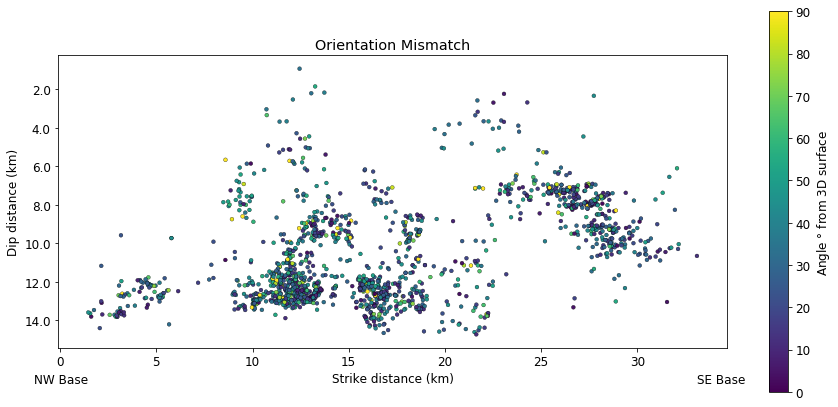

In [150]:
# Figure 6a
### ! the dip distance has flipped since previous submission: 02012020, as well as the distance being multiplied by -1
matplotlib.rcParams.update({'font.size': 12})
boo = unmodified.focalAvailable
plt.figure(figsize=(15,7))
plt.axes().set_aspect('equal')

x = (unmodified.pS[boo]-np.amin(unmodified.pS) )/1000
y = (unmodified.pD[boo]-np.amin(unmodified.pD) )/1000

plt.scatter(x, y, c=unmodified.thetaLeast*180/np.pi,
        vmin = 0, vmax = 90, linewidths=.3, edgecolors='k',
           s = 15)#3**mag)

shiftylabel = -2
plt.text(np.amin(x), np.amin(y)+shiftylabel, 'NW Base', 
         verticalalignment = 'top',
         horizontalalignment = 'right')
plt.text(np.amax(x), np.amin(y)+shiftylabel, 'SE Base', 
         verticalalignment = 'top',
         horizontalalignment = 'left')

cbar = plt.colorbar()
cbar.set_label('Angle $\degree$ from 3D surface')
plt.xlabel('Strike distance (km)')
plt.ylabel('Dip distance (km)')
plt.title('Orientation Mismatch')

ax = plt.gca()
labels = ax.get_yticks().tolist() # Manually flip the yaxis so the origin is at top of fault, not bottom
labels.reverse()
ax.set_yticklabels(labels)

plt.show()

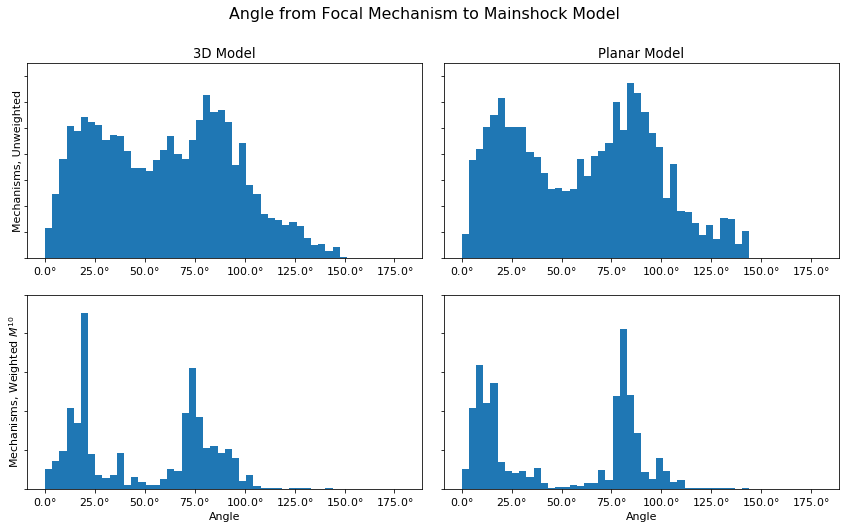

In [27]:
matplotlib.rcParams.update({'font.size': 11})
fig, axs = plt.subplots(2, 2, figsize=(12,7))

axs[0, 0].hist(
    np.array([unmodified.theta1[bN], unmodified.theta2[bN]]).ravel()*180/np.pi, 
         bins = 50, range=(0, 180), density = True # Unmodified has the wrong theat 02012020
        )
axs[0, 1].hist(np.array([planeVsSurface.theta1[bN], planeVsSurface.theta2[bN]]).ravel()*180/np.pi, 
         bins = 50, range=(0, 180), density = True
        )
axs[1,0].hist(np.array([unmodified.theta1[bN], unmodified.theta2[bN]]).ravel()*180/np.pi, 
         bins = 50, range=(0, 180), density=True,
         weights=np.array([weights[bN], weights[bN]]).ravel()
         )
axs[1,1].hist(np.array([planeVsSurface.theta1[bN], planeVsSurface.theta2[bN]]).ravel()*180/np.pi, 
         bins = 50, range=(0, 180), density = True,
         weights=np.array([weights[bN], weights[bN]]).ravel()
        )

rangeTopFig = (0, .015)
rangeBotFit = (0, .05)
for i in range(2):
    axs[0, i].set_ylim(rangeTopFig)
for i in range(2):
    axs[1, i].set_ylim(rangeBotFit)

for i in range(2): 
    for j in range(2):
        axs[i, j].tick_params(labelleft=False) 

axs[0,0].set_title('3D Model', y = 1)
axs[0,1].set_title('Planar Model', y = 1)

for i in range(2):
    axs[1, i].set_xlabel('Angle')
    
axs[0, 0].set_ylabel('Mechanisms, Unweighted')
axs[1, 0].set_ylabel('Mechanisms, Weighted $M^{10}$')

for i in range(axs.shape[0]):
    for j in range(axs.shape[1]):
        axs[i, j].set_xticklabels(['{:.1f}$\degree$'.format(x) for x in plt.gca().get_xticks()])

plt.tight_layout(pad = 1.3)
fig.suptitle("Angle from Focal Mechanism to Mainshock Model", fontsize="x-large", y = 1.05)
plt.show()